<img src="https://www.alura.com.br/artigos/assets/para-que-serve-adobe-illustrator/imagem1.jpg" alt="Imagem1.png" width="300" />


# **Redes Neurais Difusoras: Deep Learning com Pytorch**
---



## **AULA 05/06 – Arquitetura da U-Net no Processo Reverso**

Na aula anterior, exploramos o processo forward da difusão, onde mostramos como o ruído é gradualmente adicionado a uma imagem real. Introduzimos conceitos como alpha_bar, e discutimos como codificar esse processo de forma matemática e computacional. Agora, começamos a transição para o processo reverso mais profundo, onde a mágica de reconstrução acontece.

Mas para isso, precisamos de uma arquitetura neural que seja capaz de inferir, a partir de uma imagem corrompida e um tempo t, qual seria o ruído que levou aquela imagem até ali. É aí que entra a U-Net, amplamente adotada em modelos de difusão devido à sua capacidade de capturar diferentes níveis de abstração e preservar informações espaciais cruciais via skip connections, como já discutimos anteriormente.


## **Configurações iniciais**

Começamos com as importações e configuração do ambiente. Aqui também está incluído o código (comentado) para download do dataset de imagens de ressonância magnética cerebral que usaremos para treinar e visualizar o comportamento da rede.

In [ ]:
!pip install torchview -q

In [ ]:
# Bibliotecas padrão
import re
import ast
import os
import math
import shutil
import numpy as np
import textwrap
import kagglehub
import pandas as pd
from collections import defaultdict

# Bibliotecas de visualização
import imageio
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
from IPython.display import Image as Im2

# Bibliotecas PyTorch, torchvision e estatisticas
import torch.nn as nn
import torch, torch.nn.functional as F
from torch.amp import GradScaler, autocast
from torch.utils.data import random_split
from torch.utils.data import DataLoader, Dataset
from torch.nn.utils import clip_grad_norm_

import torchvision
import torchvision.transforms as transforms
from torchvision.utils import make_grid
from torchvision.transforms import v2

from torchview import draw_graph

from tqdm.auto import tqdm

device = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
# Baixar dataset
dataset_path = kagglehub.dataset_download("ashfakyeafi/brain-mri-images")

# Definir destino no /content
destination_path = '/content/brain-mri-images'

# Copiar para /content
shutil.copytree(dataset_path, destination_path, dirs_exist_ok=True)
print("Dataset copiado para:", destination_path)

Dataset copiado para: /content/brain-mri-images


Antes de explorar a U-Net em si, é fundamental termos nosso dataset estruturado. Esta classe personalizada permite ler imagens específicas de um plano de cortes diferente, exemplo 'z', além de aplicar transformações necessárias para normalização.

In [ ]:
class Dataset(Dataset):
    def __init__(self, images_dir, transform=None, slice_plane=None, side=None):
        self.transform = transform
        self.slice_plane = slice_plane
        self.side = side
        self.image_files = []

        for root, _, files in os.walk(images_dir):
            for file in files:
                if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp')):
                    parts = file.lower().split('_')
                    if len(parts) > 3:
                        plane = parts[3]
                        side_part = parts[2]
                        # Filtro fixo para side e plane
                        if plane == self.slice_plane:
                            self.image_files.append(os.path.join(root, file))

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = self.image_files[idx]
        img_name = os.path.basename(img_path).lower()

        image = Image.open(img_path).convert('L')

        parts = img_name.split('_')
        slice_plane = parts[3]

        if self.transform:
            image = self.transform(image)

        return {
            "image": image,
            "slice": slice_plane
        }


Com o dataset pronto, definimos o pipeline de transformação, como redimensionamento e normalização, e instanciamos o DataLoader. Isso garantirá que tenhamos batches preparados para o treinamento da rede posteriormente.

In [ ]:
# Definir Dimensão da Imagem
img_size = 64

# Transformação básica para normalizar para [-1,1]
transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

In [ ]:
# Dataset e DataLoader
dataset = Dataset(
    '/content/brain-mri-images',
    transform=transform,
    slice_plane='z'
    )

# Carrega dataset
dataloader = DataLoader(dataset, batch_size=128, shuffle=True)
print('Total de amostras:', len(dataset))

Total de amostras: 2564


Visualizando 16 amostras do dataset


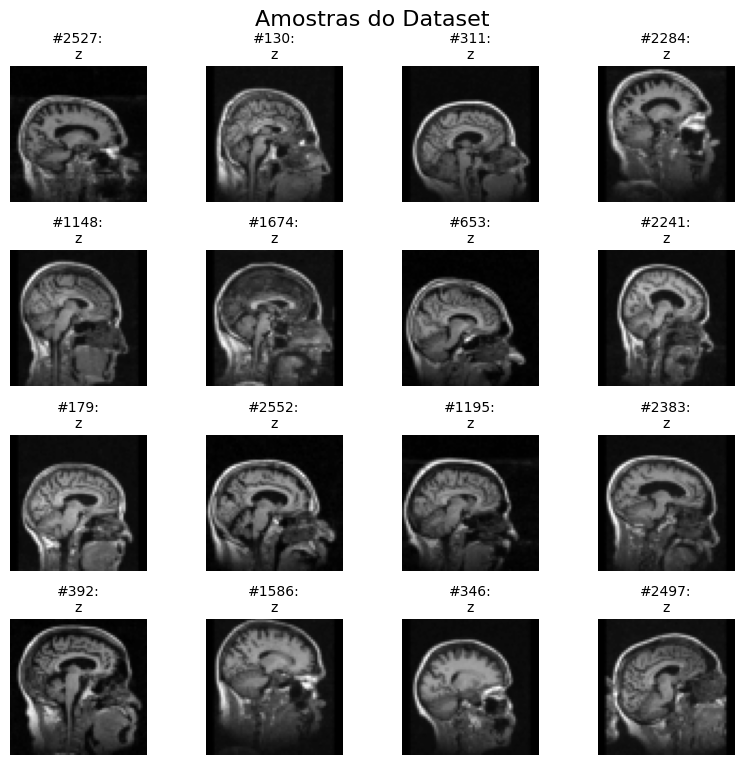

In [ ]:
# Seleciona aleatoriamente até 16 índices do dataset
indices = np.random.choice(len(dataset), size=min(16, len(dataset)), replace=False)
print(f"Visualizando {len(indices)} amostras do dataset")

# Define grid para exibição: 8 colunas e número de linhas necessário
cols = 4
rows = (len(indices) + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(8, 2 * rows))

# Garante que axes tenha sempre shape 2D para facilitar o loop
axes = np.atleast_2d(axes)

# Itera sobre cada índice selecionado e plota no grid
for i, idx in enumerate(indices):
    row, col = divmod(i, cols)
    ax = axes[row, col]

    sample = dataset[idx]

    # Recupera imagem e label
    image = sample['image']
    slice_plane = sample['slice']

    # Desnormaliza de [-1,1] para [0,1]
    img_vis = torch.clamp((image * 0.5) + 0.5, 0, 1)
    img_np = img_vis.permute(1, 2, 0).cpu().numpy()

    # Plota a imagem
    ax.imshow(img_np, cmap='gray')
    ax.axis('off')

    # Formata o texto do label em múltiplas linhas
    label = "\n".join(textwrap.wrap(str(slice_plane), width=10))
    ax.set_title(f"#{idx}:\n{slice_plane}", fontsize=10, pad=5)

# Oculta subplots vazios
total_slots = rows * cols
for i in range(len(indices), total_slots):
    row, col = divmod(i, cols)
    axes[row, col].axis('off')

# Título geral do grid
plt.suptitle("Amostras do Dataset", fontsize=16, y=0.95)
plt.tight_layout()
plt.subplots_adjust(top=0.88)
plt.show()

## **Construção Modular da U-Net**

### **Diferença da aula anteriror**

Na aula anterior (Aula 04), introduzimos a U-Net como uma arquitetura promissora para modelar o processo reverso de difusão, implementando uma versão simplificada, a MiniUNet, com dois níveis de downsampling/upsampling e blocos convolucionais básicos. Nosso foco estava em entender a motivação da arquitetura e sua aplicação na tarefa de reconstrução de imagens a partir do ruído.

Agora vançamos avançar para uma implementação mais profunda e robusta, mais alinhada com redes utilizadas em modelos como DDPM e Stable Diffusion. Agora incorporamos quatro níveis hierárquicos, blocos residuais (`ResidualTimeBlock`) com normalização por grupos, um bottleneck profundo, e uma projeção temporal mais sofisticada.

### **Embedding temporal**

O primeiro componente importante é o embedding senoidal de tempo, que permite incorporar informações do tempo t diretamente na rede. Isso é essencial para que a rede entenda o contexto dos estágios de difusão que as imagem se encontra.

In [ ]:
# Embedding senoidal de tempo
def sinusoidal_embedding(t, dim):
    half = dim // 2
    freqs = torch.exp(-math.log(10000) * torch.arange(half, device=t.device,
                                                      dtype=torch.float32) / (half - 1))
    emb = t[:, None].float() * freqs[None, :]
    return torch.cat([emb.sin(), emb.cos()], dim=1)

### **Bloco Residual com Embedding de Tempo**

Aqui construímos um bloco modular reutilizável chamado `ResidualTimeBlock`, com normalização por grupos `(GroupNorm)` e ativação `SiLU`. Esse bloco recebe não só a imagem, mas também o embedding de tempo, o que é crucial para adaptar seu comportamento ao estágio de difusão.



In [ ]:
# Bloco residual com modulação temporal
class ResidualTimeBlock(nn.Module):
    def __init__(self, in_ch, out_ch, t_dim, groups=8):
        super().__init__()
        self.same_channels = (in_ch == out_ch)

        # Primeira convolução 2D com padding=1 para manter o tamanho espacial
        self.conv1 = nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1)
        self.norm1 = nn.GroupNorm(groups, out_ch)
        self.act1  = nn.SiLU() # Função de ativação suave e não linear (Sigmoid-Weighted Linear Unit)

        # Projeção linear do vetor de tempo (t_emb) para o mesmo número de canais da feature map
        self.time_proj = nn.Linear(t_dim, out_ch)

        # Segunda convolução 2D com mesma estrutura da primeira
        self.conv2 = nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1)
        self.norm2 = nn.GroupNorm(groups, out_ch)
        self.act2  = nn.SiLU()

        # Camada de atalho (skip connection)
        self.skip = nn.Conv2d(in_ch, out_ch, kernel_size=1) if not self.same_channels else nn.Identity()

    def forward(self, x, t_emb):
        residual = self.skip(x)

        h = self.conv1(x)
        h = self.norm1(h)
        h = self.act1(h)

        # Adiciona embedding temporal após primeiro conv
        time = self.time_proj(t_emb)[:, :, None, None]
        h = h + time # Modulação aditiva com o embedding temporal

        h = self.conv2(h)
        h = self.norm2(h)
        h = self.act2(h)

        # Soma residual e divide por sqrt(2) (1.414) para estabilidade numérica (como em redes de difusão)
        return (h + residual) / 1.414

### **Blocos Down e Up**

A U-Net é caracterizada por dois caminhos: `encoder (down)` e `decoder (up)`. Nos blocos de downsampling, a imagem é progressivamente reduzida em resolução mas aumentada em canais, enquanto nos blocos de upsampling ocorre o processo inverso, com concatenação de features do caminho descendente (skip connections).

In [ ]:
# Módulo de downsampling
class Down(nn.Module):
    def __init__(self, in_ch, out_ch, t_dim):
        super().__init__()
        # Dois blocos resuduais com embedding temporal
        self.block1 = ResidualTimeBlock(in_ch,  out_ch, t_dim)
        self.block2 = ResidualTimeBlock(out_ch, out_ch, t_dim)
        # Reduz a resolução pela metade (stride=2)
        self.pool   = nn.Conv2d(out_ch, out_ch, kernel_size=4, stride=2, padding=1)

    def forward(self, x, t_emb):
        x = self.block1(x, t_emb)
        x = self.block2(x, t_emb)
        p = self.pool(x)
        return x, p # retorna feature para skip e output reduzido


# Módulo de upsampling
class Up(nn.Module):
    def __init__(self, in_ch, skip_ch, out_ch, t_dim):
        super().__init__()
        # Aumenta a resolução pela metade com transposed conv
        self.up     = nn.ConvTranspose2d(in_ch, out_ch, kernel_size=4, stride=2, padding=1)
        # Concatena skip connection e processa
        self.block1 = ResidualTimeBlock(out_ch + skip_ch, out_ch, t_dim)
        self.block2 = ResidualTimeBlock(out_ch, out_ch, t_dim)

    def forward(self, x, skip, t_emb):
        x = self.up(x)
        # Concatena canal do skip connection
        x = torch.cat([x, skip], dim=1)
        x = self.block1(x, t_emb)
        x = self.block2(x, t_emb)
        return x

### **Classe Final**

Integramos todos os módulos anteriores em uma arquitetura U-Net funcional. Observa-se o uso do bottleneck profundo entre as fases de down e upsampling, essencial para processamento global da imagem. A camada de saída usa `Conv2d` para retornar uma imagem com o mesmo número de canais que a entrada.

In [ ]:
class UNet(nn.Module):
    def __init__(self,
                 in_channels=1,
                 base_channels=64,
                 time_dim=256):
        super().__init__()

        # MLP para processar embedding temporal
        self.time_mlp = nn.Sequential(
            nn.Linear(time_dim, time_dim*4),
            nn.SiLU(),
            nn.Linear(time_dim*4, time_dim)
        )

        # Encoder (downsampling)
        self.down1 = Down(in_channels,     base_channels,     time_dim)
        self.down2 = Down(base_channels,   base_channels*2,   time_dim)
        self.down3 = Down(base_channels*2, base_channels*4,   time_dim)
        self.down4 = Down(base_channels*4, base_channels*8,   time_dim)

        # Bottleneck com blocos residuais mais profundos
        self.bot1 = ResidualTimeBlock(base_channels*8, base_channels*16, time_dim)
        self.bot2 = ResidualTimeBlock(base_channels*16, base_channels*8,  time_dim)

        # Decoder (upsampling)
        self.up4 = Up(base_channels*8, base_channels*8, base_channels*4, time_dim)
        self.up3 = Up(base_channels*4, base_channels*4, base_channels*2, time_dim)
        self.up2 = Up(base_channels*2, base_channels*2, base_channels,   time_dim)
        self.up1 = Up(base_channels,   base_channels,   base_channels,   time_dim)

        # Camada de saída
        self.out = nn.Conv2d(base_channels, in_channels, kernel_size=1)

    def forward(self, x, t):
        # Cria embedding temporal
        t_emb = sinusoidal_embedding(t, self.time_mlp[0].in_features)
        t_emb = self.time_mlp(t_emb)

        # Encoder: reduz resolução, guarda skips
        s1, p1 = self.down1(x, t_emb)
        s2, p2 = self.down2(p1, t_emb)
        s3, p3 = self.down3(p2, t_emb)
        s4, p4 = self.down4(p3, t_emb)

        # Bottleneck: processamento profundo
        b = self.bot1(p4, t_emb)
        b = self.bot2(b, t_emb)

        # Decoder: reconstrói resolução e usa skips
        u4 = self.up4(b,  s4, t_emb)
        u3 = self.up3(u4, s3, t_emb)
        u2 = self.up2(u3, s2, t_emb)
        u1 = self.up1(u2, s1, t_emb)

        return self.out(u1)

In [ ]:
# Definir Modelo e otimizador
model = UNet().to(device)
opt = torch.optim.AdamW(model.parameters(), lr=1e-4)

### **Visualização Estrutural com Torchview**

Utilizando a biblioteca `torchview`, conseguimos visualizar o grafo computacional da U-Net com um passo de entrada. Isso auxilia na depuração e entendimento da arquitetura final.

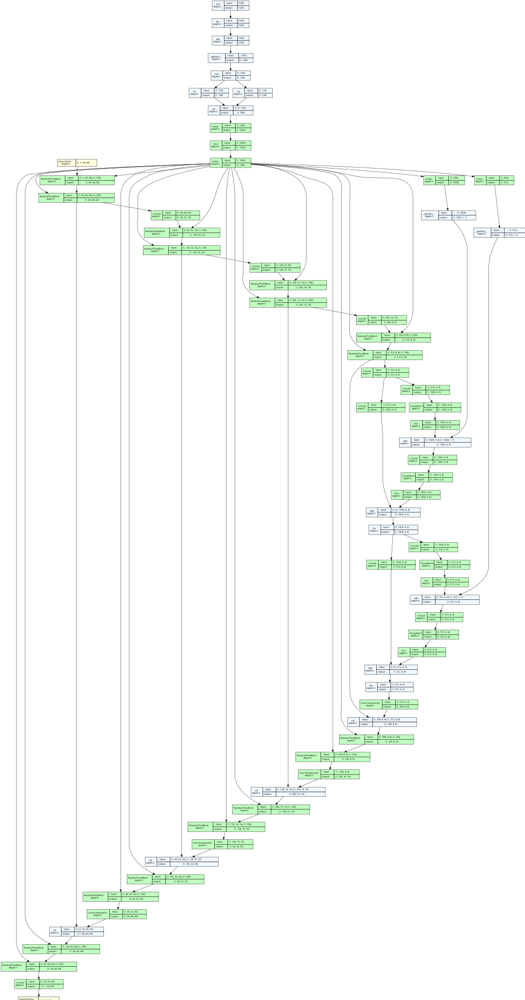

In [ ]:
## extrai um batch do seu dataloader
batch = next(iter(dataloader))
x_sample = batch['image'].to(device)

# Pegar um batch pequeno
x_sample = x_sample[:1]

# Criar uma classe para fixar o timestep
class WrappedUNet(nn.Module):
    def __init__(self, unet):
        super().__init__()
        self.unet = unet
    def forward(self, x):
        t = torch.tensor([500], device=x.device)  # timestep fixo
        return self.unet(x, t)

wrapped_model = WrappedUNet(model)

# Desenhar o diagrama
graph = draw_graph(wrapped_model,
                   input_data=x_sample,
                   graph_name="U-Net Pixel Art",
                   roll=True)
graph.visual_graph

### **Fluxo do dado: shapes típicos**

Para melhor compreender o comportamento da rede, adicionamos hooks em camadas específicas para capturar os feature maps. Isso nos permite observar como a imagem é transformada camada por camada.

In [ ]:
# Dicionário para armazenar as ativações
activations = defaultdict(list)

# Função para registrar hooks
def register_hooks(model):
    for name, module in model.named_modules():
        if isinstance(module, (nn.Conv2d, nn.ConvTranspose2d, nn.GroupNorm)):

            # Define a função hook que será chamada durante o forward do módulo
            def hook(m, i, o, name=name):
                if len(activations[name]) == 0:  # grava só o primeiro
                    activations[name].append(o.detach().cpu())

            # Registra o hook para o módulo atual
            module.register_forward_hook(hook)

# Limpa ativações anteriores
activations.clear()

# Chama a função para registrar os hooks
register_hooks(model)

In [ ]:
# Fazer forward
sample_batch = next(iter(dataloader))['image'].to(device)
sample_t = torch.randint(0,1000,(sample_batch.size(0),)).to(device)
_ = model(sample_batch, sample_t)

# Imprime quantos tensores foram capturados por layer
print("Ativações registradas:")
for k,v in activations.items():
    print(f"{k:25s} ➜ {len(v)} tensor")

Ativações registradas:
down1.block1.skip         ➜ 1 tensor
down1.block1.conv1        ➜ 1 tensor
down1.block1.norm1        ➜ 1 tensor
down1.block1.conv2        ➜ 1 tensor
down1.block1.norm2        ➜ 1 tensor
down1.block2.conv1        ➜ 1 tensor
down1.block2.norm1        ➜ 1 tensor
down1.block2.conv2        ➜ 1 tensor
down1.block2.norm2        ➜ 1 tensor
down1.pool                ➜ 1 tensor
down2.block1.skip         ➜ 1 tensor
down2.block1.conv1        ➜ 1 tensor
down2.block1.norm1        ➜ 1 tensor
down2.block1.conv2        ➜ 1 tensor
down2.block1.norm2        ➜ 1 tensor
down2.block2.conv1        ➜ 1 tensor
down2.block2.norm1        ➜ 1 tensor
down2.block2.conv2        ➜ 1 tensor
down2.block2.norm2        ➜ 1 tensor
down2.pool                ➜ 1 tensor
down3.block1.skip         ➜ 1 tensor
down3.block1.conv1        ➜ 1 tensor
down3.block1.norm1        ➜ 1 tensor
down3.block1.conv2        ➜ 1 tensor
down3.block1.norm2        ➜ 1 tensor
down3.block2.conv1        ➜ 1 tensor
down3.block2.no

### **Visualizar feature maps**

Finalmente, usamos o matplotlib para inspecionar visualmente os feature maps de algumas camadas-chave como `down1.block1.conv1`, `bot1.conv1` e `out`. Isso ajuda a entender quais padrões a rede está aprendendo e como diferentes canais respondem aos dados de entrada.

Visualizando down1.block1.conv1


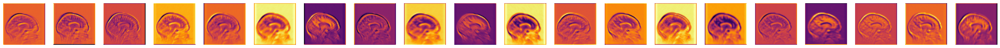

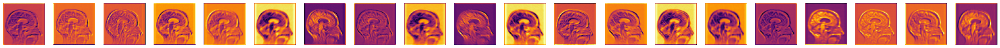

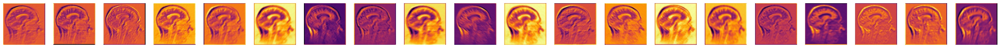

Visualizando bot1.conv1


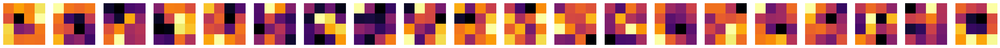

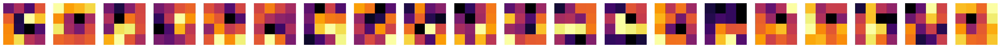

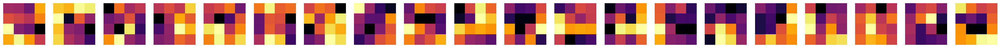

Visualizando out


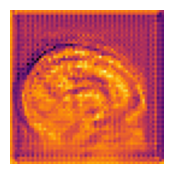

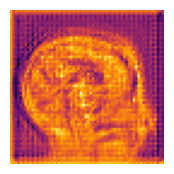

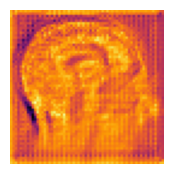

In [ ]:
# Lista de indice de imagens
list_img = [0, 1, 2]

# Função para visualziar feature map
def show_feature_map(tensor, list_img):
    for img in list_img:
        fmap = tensor[img]

        # Número de canais disponíveis
        num_channels = fmap.shape[0]

        # Define n como mínimo entre 20 ou número de canais
        n = min(20, num_channels)

        # Teste de poucos canais de cor
        if n < 3 and num_channels >= 3:
            n = 3
        elif num_channels < n:
            n = num_channels

        fig, axs = plt.subplots(1, n, figsize=(n*2,2))
        if n == 1:
            axs = [axs]  # garantir iterável

        for i in range(n):
            axs[i].imshow(fmap[i], cmap='inferno')
            axs[i].axis('off')
        plt.show()

# Visualiza feature maps em camadas diferentes da rede neural
for layer in ['down1.block1.conv1','bot1.conv1', 'out',]:
    print(f"Visualizando {layer}")
    show_feature_map(activations[layer][0], list_img)

### **Parâmetros do Processo de Difusão**

Agora que temos a U-Net definida, vamos configurá-la para treinar dentro de um processo de difusão do tipo DDPM (Denoising Diffusion Probabilistic Models). Isso requer definirmos a agenda de ruído, os valores de $β_t$ ao longo do tempo, e calcular os termos auxiliares como $α_t$ e $ᾱ_t$.

In [ ]:
T = 1000  # número de passos
beta_start, beta_end = 1e-4, 0.02

# beta schedule linear
betas = torch.linspace(beta_start, beta_end, T).to(device)

# Alphas para preservar os valores
alphas = 1.0 - betas

# Produto acumulado dos alphas
alpha_bar = torch.cumprod(alphas, 0)

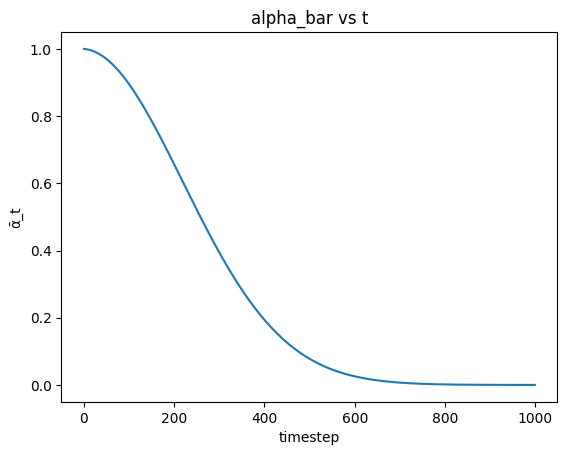

In [ ]:
# Visualizar alpha acumulado
plt.plot(alpha_bar.cpu())
plt.title("alpha_bar vs t")
plt.xlabel("timestep")
plt.ylabel("ᾱ_t")
plt.show()

#### **Forward Process (q_sample)**

Definimos agora a função `q_sample`, responsável por adicionar ruído $ε$ ao dado real $x_0$ segundo a distribuição $q(x_t | x_0)$. Esse é o processo forward do DDPM.

In [ ]:
def q_sample(x0, t, noise):
    t = t.to(x0.device)

    # Extrai sqrt(ᾱ_t) para cada t do batch e adiciona dimensões extras
    sqrt_alpha_bar_t = torch.sqrt(alpha_bar[t]).view(-1, 1, 1, 1)

    # Extrai sqrt(1 - ᾱ_t) de mesmo modo
    sqrt_one_minus_alpha_bar_t = torch.sqrt(1 - alpha_bar[t]).view(-1, 1, 1, 1)

    # Retorna sqrt(ᾱ_t) * x0 + sqrt(1 - ᾱ_t) * noise (distribuição q(x_t | x_0))
    return sqrt_alpha_bar_t * x0 + sqrt_one_minus_alpha_bar_t * noise

#### **Reverse Process (p_sample_ddpm)**

O passo central do processo de geração é o reverse. Aqui usamos a U-Net para prever o ruído ε e reconstruir a imagem do passo anterior $x_{t-1}$.

In [ ]:
@torch.no_grad()
def p_sample_ddpm(model, x, t, betas, alphas, alpha_bar, add_noise=True):
    B = x.size(0)
    t_tensor = torch.full((B,), t, device=device, dtype=torch.long)

    # Predição do ruído
    pred_noise = model(x, t_tensor)

    # Parâmetros
    beta_t = betas[t]
    alpha_t = alphas[t]
    alpha_bar_t = alpha_bar[t]

    # Média do posterior
    coeff1 = 1 / torch.sqrt(alpha_t)
    coeff2 = beta_t / torch.sqrt(1 - alpha_bar_t)
    mean = coeff1 * (x - coeff2 * pred_noise)

    if add_noise and t > 0:
        # Variância melhorada
        alpha_bar_prev = alpha_bar[t-1] if t > 0 else torch.tensor(1.0)
        posterior_variance = beta_t * (1 - alpha_bar_prev) / (1 - alpha_bar_t)
        noise = torch.randn_like(x)
        x_prev = mean + torch.sqrt(posterior_variance) * noise
    else:
        x_prev = mean

    return x_prev

## **Experimentos**

#### **Treinamento do Modelo**

In [ ]:
def show_and_predict(model, x, T, epoch=None):
    for t in reversed(range(T)):
        x = p_sample_ddpm(model, x, t, betas, alphas, alpha_bar)

    img = (x.clamp(-1,1)+1)/2
    img = img[0].permute(1,2,0).cpu().numpy()
    img = (img*255).astype('uint8')

    fig, ax = plt.subplots()
    ax.imshow(img, cmap='gray')
    ax.axis('off')

    if epoch:
        ax.text(0, 0, f"Epoch {epoch}", fontsize=12, color='white',
                bbox=dict(boxstyle='round,pad=0.2', facecolor='red', alpha=0.9))

    plt.show()
    return img

Treinando modelo com 150 épocas...


Épocas:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch 1:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 2:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 3:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 4:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 5:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 6:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 7:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 8:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 9:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 10:   0%|          | 0/21 [00:00<?, ?it/s]

Época 10/150 – loss médio: 0.0327


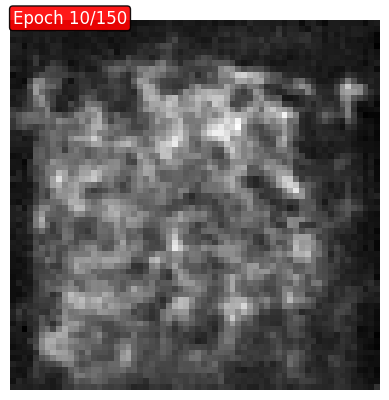

Epoch 11:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 12:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 13:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 14:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 15:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 16:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 17:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 18:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 19:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 20:   0%|          | 0/21 [00:00<?, ?it/s]

Época 20/150 – loss médio: 0.0275


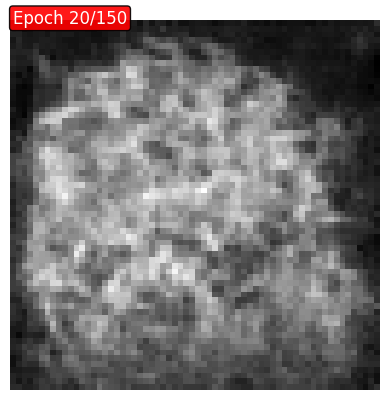

Epoch 21:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 22:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 23:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 24:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 25:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 26:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 27:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 28:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 29:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 30:   0%|          | 0/21 [00:00<?, ?it/s]

Época 30/150 – loss médio: 0.0256


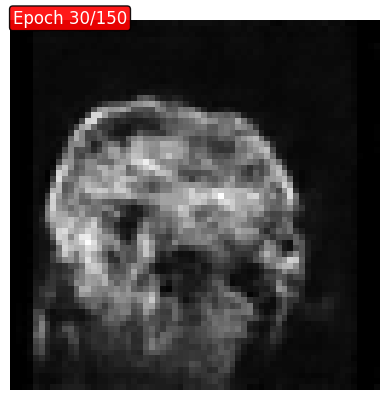

Epoch 31:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 32:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 33:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 34:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 35:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 36:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 37:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 38:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 39:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 40:   0%|          | 0/21 [00:00<?, ?it/s]

Época 40/150 – loss médio: 0.0254


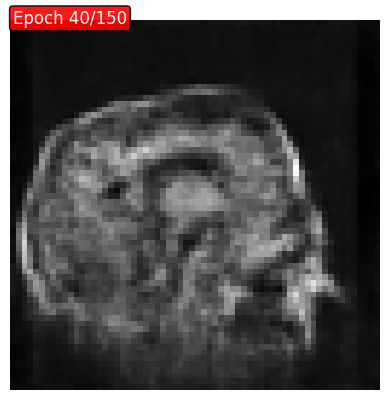

Epoch 41:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 42:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 43:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 44:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 45:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 46:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 47:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 48:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 49:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 50:   0%|          | 0/21 [00:00<?, ?it/s]

Época 50/150 – loss médio: 0.0248


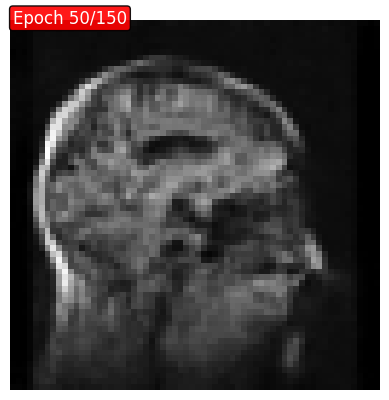

Epoch 51:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 52:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 53:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 54:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 55:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 56:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 57:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 58:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 59:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 60:   0%|          | 0/21 [00:00<?, ?it/s]

Época 60/150 – loss médio: 0.0237


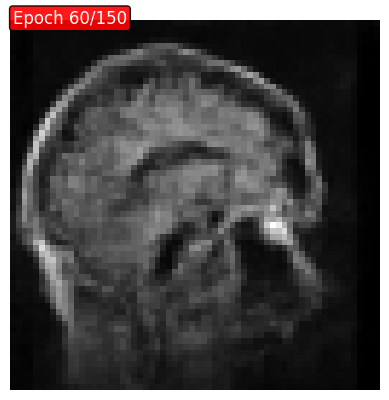

Epoch 61:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 62:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 63:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 64:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 65:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 66:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 67:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 68:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 69:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 70:   0%|          | 0/21 [00:00<?, ?it/s]

Época 70/150 – loss médio: 0.0220


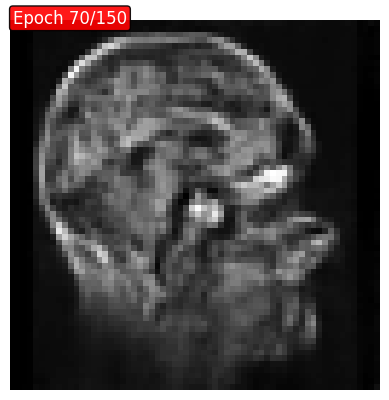

Epoch 71:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 72:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 73:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 74:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 75:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 76:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 77:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 78:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 79:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 80:   0%|          | 0/21 [00:00<?, ?it/s]

Época 80/150 – loss médio: 0.0225


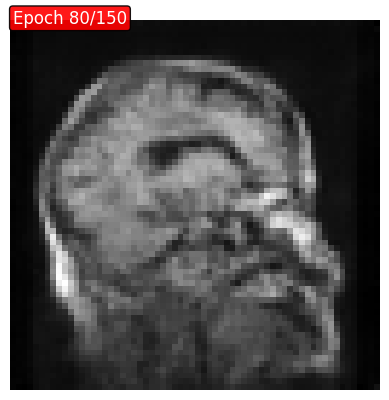

Epoch 81:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 82:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 83:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 84:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 85:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 86:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 87:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 88:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 89:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 90:   0%|          | 0/21 [00:00<?, ?it/s]

Época 90/150 – loss médio: 0.0205


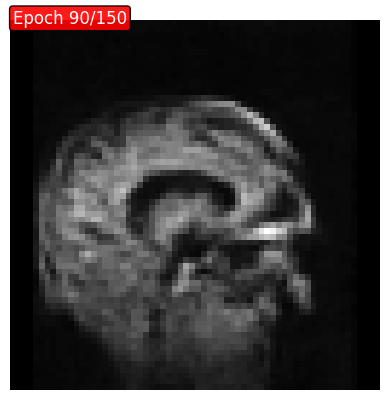

Epoch 91:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 92:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 93:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 94:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 95:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 96:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 97:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 98:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 99:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 100:   0%|          | 0/21 [00:00<?, ?it/s]

Época 100/150 – loss médio: 0.0216


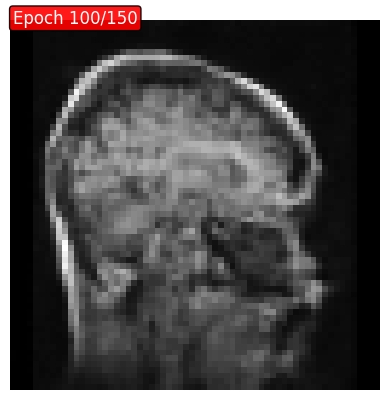

Epoch 101:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 102:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 103:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 104:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 105:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 106:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 107:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 108:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 109:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 110:   0%|          | 0/21 [00:00<?, ?it/s]

Época 110/150 – loss médio: 0.0250


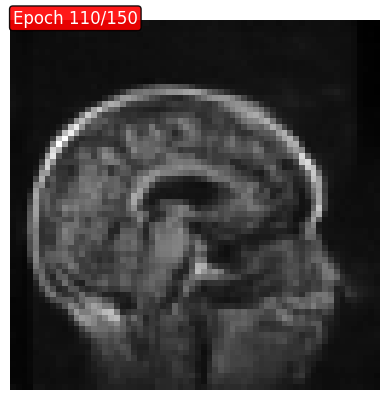

Epoch 111:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 112:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 113:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 114:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 115:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 116:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 117:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 118:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 119:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 120:   0%|          | 0/21 [00:00<?, ?it/s]

Época 120/150 – loss médio: 0.0209


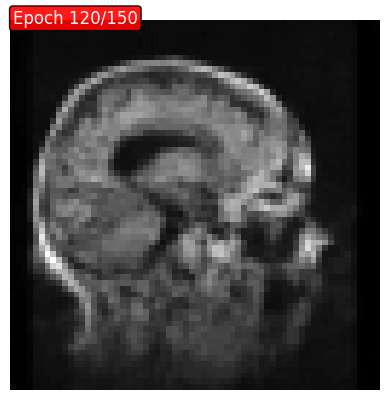

Epoch 121:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 122:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 123:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 124:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 125:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 126:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 127:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 128:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 129:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 130:   0%|          | 0/21 [00:00<?, ?it/s]

Época 130/150 – loss médio: 0.0230


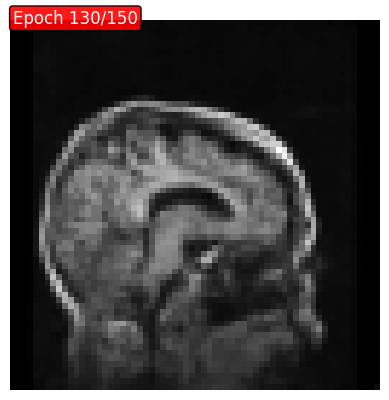

Epoch 131:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 132:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 133:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 134:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 135:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 136:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 137:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 138:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 139:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 140:   0%|          | 0/21 [00:00<?, ?it/s]

Época 140/150 – loss médio: 0.0214


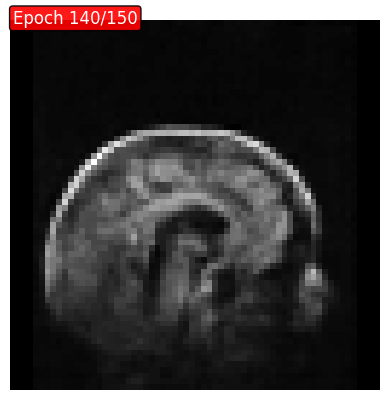

Epoch 141:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 142:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 143:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 144:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 145:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 146:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 147:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 148:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 149:   0%|          | 0/21 [00:00<?, ?it/s]

Epoch 150:   0%|          | 0/21 [00:00<?, ?it/s]

Época 150/150 – loss médio: 0.0242


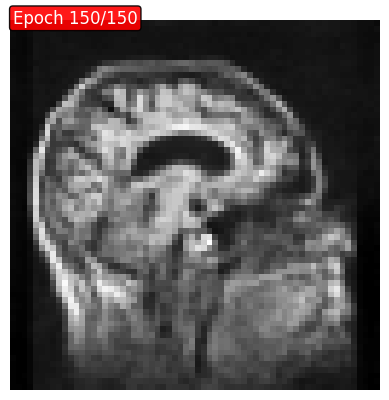

In [ ]:
scaler = GradScaler()  # escala dinâmica de gradientes

epochs = 150
model.train()
print(f"Treinando modelo com {epochs} épocas...")
frames = []

for epoch in tqdm(range(epochs), desc="Épocas"):
    epoch_loss = 0
    num_batches = 0

    batch_iterator = tqdm(enumerate(dataloader), desc=f"Epoch {epoch+1}", leave=False, total=len(dataloader))
    for batch_idx, batch in batch_iterator:
        x0 = batch["image"].to(device) if isinstance(batch, dict) else batch.to(device)
        noise = torch.randn_like(x0)
        t = torch.randint(0, T, (x0.size(0),), device=device)
        xt = q_sample(x0, t, noise)

        opt.zero_grad()

        # Mixed Precision: autocast ativa
        with autocast(device_type='cuda'):
            pred = model(xt, t)
            loss = F.mse_loss(pred, noise)

        # Backward com GradScaler
        scaler.scale(loss).backward()

        # Clipping para estabilidade (máximo L2 global = 1.0)
        clip_grad_norm_(model.parameters(), max_norm=1.0)

        # Step e atualização do scaler
        scaler.step(opt)
        scaler.update()

        epoch_loss += loss.item()
        num_batches += 1
        batch_iterator.set_postfix(loss=loss.item())

    if (epoch + 1) % 10 == 0:
        avg_loss = epoch_loss / num_batches
        tqdm.write(f"Época {epoch+1}/{epochs} – loss médio: {avg_loss:.4f}")

        model.eval()
        with torch.no_grad():
            samples = torch.randn(1, 1, img_size, img_size, device=device)
            img = show_and_predict(model, samples, T, epoch=f'{epoch+1}/{epochs}')
            frames.append(img)

Com os frames coletados durante o treinamento, criamos um GIF para visualizar como as amostras evoluem ao longo das épocas.

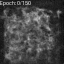

In [ ]:
normalized_frames = []

font = ImageFont.load_default(size=5)

# Cria GIF de treinamento
for id, frame in enumerate(frames):
    img_array = np.array(frame)
    img_array = np.concatenate([img_array] * 3, axis=2)

    img_pil = Image.fromarray(img_array)
    draw = ImageDraw.Draw(img_pil)

    acc_text = "Epoch: " + str(id*10) + "/" + str(epochs)
    draw.text((0, 0), acc_text, font=font, fill=(255, 255, 255))
    normalized_frames.append(np.array(img_pil))

imageio.mimsave("training_process.gif", normalized_frames, fps=2, loop=0)
Im2(filename="training_process.gif", width=300)

Testamos a U-Net gerada com ruído puro, avaliando a capacidade do modelo de reconstruir uma imagem.

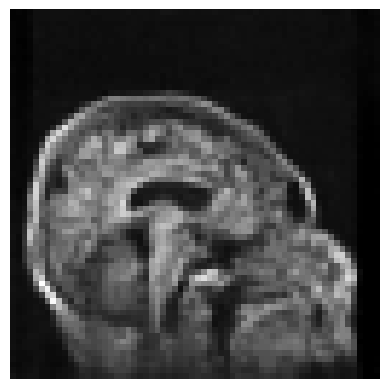

In [ ]:
# Gerar uma imagem de teste
x = torch.randn(1, 1, img_size, img_size, device=device)
predicted_image = show_and_predict (model, x, T)

Geramos imagens ao longo do tempo $t$, salvando snapshots de tempos específicos (a cada 50 passos) e criando um grid visual.

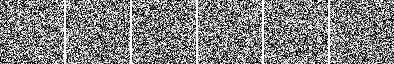

In [ ]:
# Gerar Gif de teste com steps
frames = []

# Gerar 6 matrizes completamente aleatórias
x = torch.randn(6, 1, img_size, img_size, device=device)

# Executar reverse
for t in reversed(range(T)):
    x = p_sample_ddpm(model, x, t, betas, alphas, alpha_bar)
    if t % 50 == 0 or t < 5:

        # lista de imagens individuais
        imgs = [im.cpu().detach() for im in x]

        # cria separacao entre as imagens
        pad = torch.ones((1, img_size, 2))  # (C, H, W)

        # intercala imagens e padding
        concat_list = []
        for i, img in enumerate(imgs):
            concat_list.append(img)
            if i < len(imgs)-1:
                concat_list.append(pad)

        # empilha horizontalmente
        img_grid = torch.cat(concat_list, dim=2).permute(1,2,0)
        img_grid = (img_grid.clamp(-1,1)+1)/2  # [0,1]
        img_grid = (img_grid.numpy() * 255).astype('uint8')
        frames.append(img_grid)

# cria GIF
normalized_frames = []
for frame in frames:
    img_array = np.array(frame)

    img_array = np.concatenate([img_array]*3, axis=2)
    normalized_frames.append(img_array)

imageio.mimsave("diffusion_process.gif", normalized_frames, fps=4, loop=0)
Im2(filename="diffusion_process.gif", width=700)

Geramos imagens ao longo do tempo $t$, salvando snapshots de tempos específicos (a cada 50 passos) e criando um grid visual.

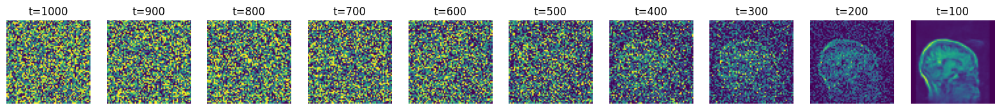

In [ ]:
# Gerar nova imagem de puro ruído
x = torch.randn(1, 1, img_size, img_size, device=device)

imgs_over_time = []

for t in reversed(range(0, T)):
    x = p_sample_ddpm(model, x, t, betas, alphas, alpha_bar)

    # Salva snapshots só a cada 100 steps
    if t % 100 == 0 or t == 0:
        img_vis = (x.clamp(-1,1)+1)/2  # [-1,1] -> [0,1]
        imgs_over_time.append(img_vis[0].detach().cpu())

fig, axs = plt.subplots(1, len(imgs_over_time), figsize=(2*len(imgs_over_time),2))
for i, img in enumerate(imgs_over_time):
    axs[i].imshow(img.permute(1,2,0).numpy())
    axs[i].axis('off')
    axs[i].set_title(f"t={T-100*i}")
plt.show()

#### **Visualizar feature maps depois do treinamento**

Repetimos a análise de feature maps, mas agora após o treinamento, observando como os mapas de ativação mudaram e o que a rede aprendey em termos visuais.

Feature maps no step t=900


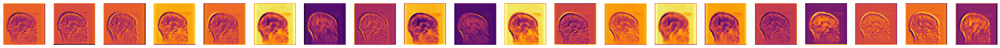

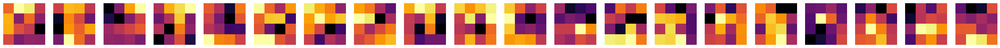

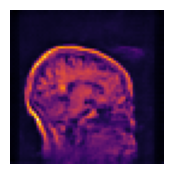

Feature maps no step t=800


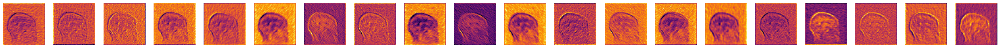

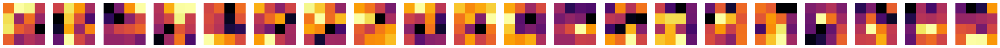

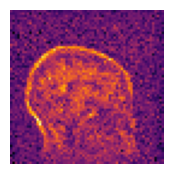

Feature maps no step t=700


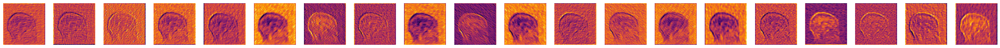

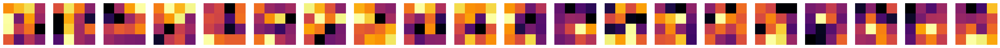

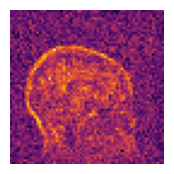

Feature maps no step t=600


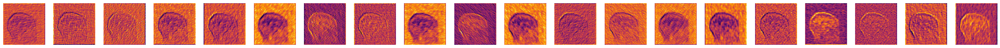

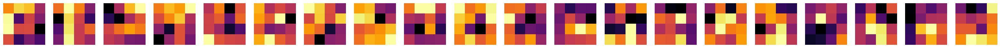

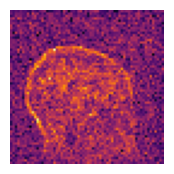

Feature maps no step t=500


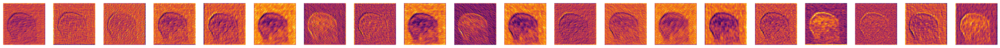

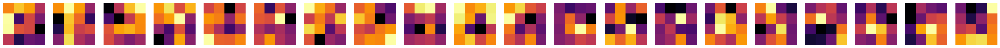

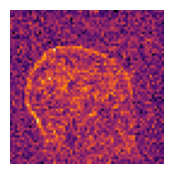

Feature maps no step t=400


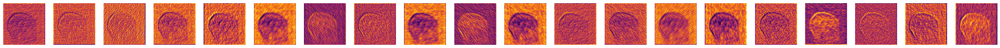

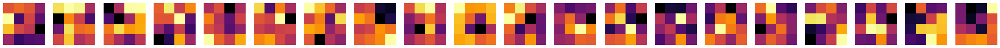

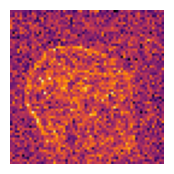

Feature maps no step t=300


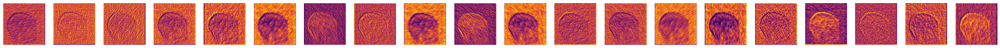

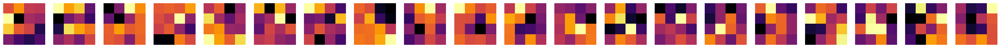

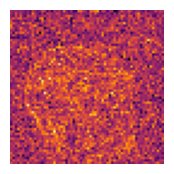

Feature maps no step t=200


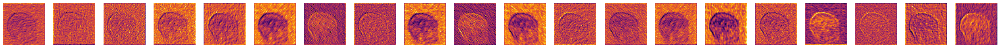

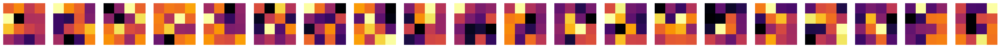

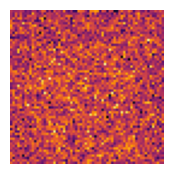

Feature maps no step t=100


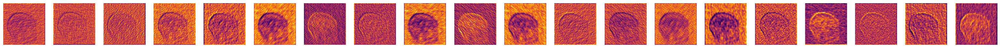

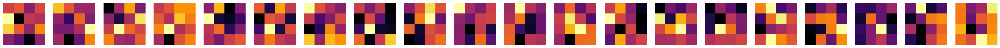

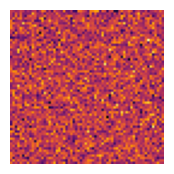

Feature maps no step t=0


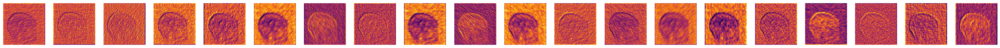

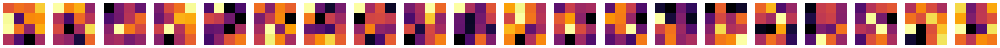

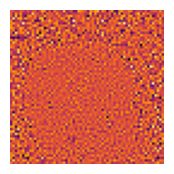

In [ ]:
# Gerar visualização feature map em diferentes passos
for t in reversed(range(0, T, 100)):

    # Limpa o dicionário anterior
    activations.clear()

    #Realiza geracao com step específico
    x = p_sample_ddpm(model, x, t, betas, alphas, alpha_bar)

    print(f"Feature maps no step t={t}")
    for layer in ['down1.block1.conv1','bot1.conv1', 'out',]:
        show_feature_map(activations[layer][0], list_img=[0])